### The main components of storytelling with data are:
1. Understanding and setting the context
2. Exploring multiple angles
3. Using compelling visualizations
4. Using varied data sources
5. Having a consistent narrative

# Collecting data and finding supplementary data

Let's take a look at SAT score data in New York City. [NYC OpenData](https://opendata.cityofnewyork.us/) provides several different datasets on their website for the public to use. The core of this project will be based around two datasets: [SAT Results](https://data.cityofnewyork.us/Education/2012-SAT-Results/f9bf-2cp4) and the [NYC High School Directory](https://data.cityofnewyork.us/Education/2014-2015-DOE-High-School-Directory/n3p6-zve2).

Using only these two datasets may be enough to produce a basic analysis. However, in order to provide more depth to the topic and to enhance the analysis, we should look to supplement the core data with other relevant datasets. Incorporating a multitude of data to support a compelling analysis will help drive home the eventual results.

In this case, there are several related data sets we can use from the website that cover demographic information and test scores.

We will use the following datasets in this analysis:<br />
 - [SAT results by school](https://data.cityofnewyork.us/Education/SAT-Results/f9bf-2cp4) — SAT results for each high school in New York City.<br />
 - [NYC high school directory](https://data.cityofnewyork.us/Education/2014-2015-DOE-High-School-Directory/n3p6-zve2) — Directory for each high schooo in New York City.<br />
 - [School attendance](https://data.cityofnewyork.us/Education/School-Attendance-and-Enrollment-Statistics-by-Dis/7z8d-msnt) — attendance information on every school in NYC.<br />
 - [Math test results](https://data.cityofnewyork.us/Education/NYS-Math-Test-Results-By-Grade-2006-2011-School-Le/jufi-gzgp) — math test results for every school in NYC.<br />
 - [Class size](https://data.cityofnewyork.us/Education/2010-2011-Class-Size-School-level-detail/urz7-pzb3) — class size information for each school in NYC.<br />
 - [AP test results](https://data.cityofnewyork.us/Education/AP-College-Board-2010-School-Level-Results/itfs-ms3e) — Advanced Placement exam results for each high school. Passing AP exams can get you college credit in the US.<br />
 - [Graduation outcomes](https://data.cityofnewyork.us/Education/Graduation-Outcomes-Classes-Of-2005-2010-School-Le/vh2h-md7a) — percentage of students who graduated, and other outcome information.<br />
 - [Demographics](https://data.cityofnewyork.us/Education/School-Demographics-and-Accountability-Snapshot-20/ihfw-zy9j) — demographic information for each school.<br />
 - [School survey](https://data.cityofnewyork.us/Education/NYC-School-Survey-2011/mnz3-dyi8) — surveys of parents, teachers, and students at each school.<br />
 - [School district maps](https://data.cityofnewyork.us/Education/School-Districts/r8nu-ymqj) — contains information on the layout of the school districts, so that we can map them out.<br />

These datasets are interrelated and therefore we can combine them before doing any analysis.

# Getting background information
Before diving into analyzing the data, it's useful to research some background information. In this case, we know a few facts that will be useful:

 - New York City is divided into `5` boroughs, which are essentially distinct regions.
 - Schools in New York City are divided into several school district, each of which can contains dozens of schools.
 - Not all the schools in all of the datasets are high schools, so we'll need to do some data cleaning.
 - Each school in New York City has a unique code called a `DBN`, or District Borough Number.
 - By aggregating data by district, we can use the district mapping data to plot district-by-district differences.

# Exploratory data analysis

The first step to understand the data is to do some exploratory data analysis, so let's examine the datasets we've gathered above.<br />

[NYC OpenData](https://opendata.cityofnewyork.us/) makes most of their data sets available via API on their website. The data is available in both `JSON` and `CSV` format. For example, the data for [SAT results](https://data.cityofnewyork.us/Education/SAT-Results/f9bf-2cp4) is available in `CSV` format from this [link](https://data.cityofnewyork.us/resource/734v-jeq5.csv). For the purposes of this analysis, we will pull from the API in `CSV` format.

First, let's create a dictionary to store each data set and API link. Then we can loop through that dictionary to read each file into a pandas `DataFrame`.


In [1]:
import pandas as pd
import numpy as np

files = {'sat_results':'sat_results.csv',
        'hs_directory':'hs_directory.csv',
        'math_results':'math_results.csv',
        'class_size':'class_size.csv',
        'ap_results':'ap_results.csv',
        'grad_outcomes':'grad_outcomes.csv',
        'demographics':'demographics.csv'
        }

# Put data from each link into a DataFrame then store the data in
# a new dictionary called 'data'
data = {}
for key, value in files.items():
    d = pd.read_csv("/Users/swagbird/Desktop/Data Science/Projects/"\
                    "Dataquest Portfolio Series/Storytelling with Data"\
                    "/data/{0}".format(value))
    data[key] = d

In [2]:
for k,v in data.items():
    print(v.shape)

(478, 6)
(435, 64)
(28478, 16)
(27611, 16)
(258, 5)
(25096, 23)
(10075, 38)


In [3]:
# Print columns and the first 5 lines of each DataFrame in our dictionary
for k,v in data.items():
    print("\n" + k + "\n")
    print(v.columns)
    print(v.head())


sat_results

Index(['DBN', 'SCHOOL NAME', 'Num of SAT Test Takers',
       'SAT Critical Reading Avg. Score', 'SAT Math Avg. Score',
       'SAT Writing Avg. Score'],
      dtype='object')
      DBN                                    SCHOOL NAME  \
0  01M292  HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES   
1  01M448            UNIVERSITY NEIGHBORHOOD HIGH SCHOOL   
2  01M450                     EAST SIDE COMMUNITY SCHOOL   
3  01M458                      FORSYTH SATELLITE ACADEMY   
4  01M509                        MARTA VALLE HIGH SCHOOL   

  Num of SAT Test Takers SAT Critical Reading Avg. Score SAT Math Avg. Score  \
0                     29                             355                 404   
1                     91                             383                 423   
2                     70                             377                 402   
3                      7                             414                 401   
4                     44                         

# Unifying the data

Now that we have all our datasets imported into `DataFrames`. Let's try to unify them all into one. Looks like most of the datasets have a `DBN` column. `DBN` serves as a unique identifier for each school and it looks like it's present in most of our datasets. Let's do a quick check:

In [4]:
# Print columns and the first 5 lines of each DataFrame in our dictionary
for k,v in data.items():
    if 'DBN' in v.columns:
        print(k)

sat_results
math_results
ap_results
grad_outcomes
demographics


`DBN` is missing from two datasets: `hs_directory` and `class_size`. In `hs_directory` the `DBN` column is named `dbn`, so we just need to rename that column. Let's find out how we can link `class_size` back to the other six datasets.

The `DBN` column looks like this:

In [5]:
data['demographics'].DBN.head()

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

What does the `class_size` dataset look like?

In [6]:
data['class_size'].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


Comparing the `DBN` column to the `class_size` data, it looks like `DBN` is a combination of the first three columns: `CSD`, `BOROUGH`, and `SCHOOL CODE`. `DBN` stands for "District Borough Number", so it seems that `CSD` is the "District", `BOROUGH` is the "Borough", and `SCHOOL CODE` is the "Number". It looks like `BOROUGH` is already contained within `SCHOOL CODE`, and therefore, `DBN` can be formulated by combining `CSD` with `SCHOOL CODE`.

Let's add the `DBN` column to `class_size` and rename it in `hs_directory`:

In [7]:
data['class_size']["DBN"] = data['class_size'].apply(lambda x: '{0:02d}{1}'.format(x['CSD'], x['SCHOOL CODE']), axis=1)

In [8]:
data['class_size'].head(1)

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015


In [9]:
data['hs_directory'].rename(columns={'dbn':'DBN'}, inplace=True)

In [10]:
data['hs_directory'].head(1)

,DBN,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,...,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,17K548,Brooklyn School for Music & Theatre,Brooklyn,K440,718-230-6250,718-230-6262,9.0,12,NaN,NaN,...,NaN,NaN,NaN,"883 Classon Avenue\nBrooklyn, NY 11225\n(40.67...",9.0,35.0,213.0,3029686.0,3.011870e+09,Crown Heights South ...


# Including survey data 

The survey data is split up between two files: data for all schools and data for school district 75. We will create a flag for district 75 schools, and then we will concatenate these two datasets into one combined `DataFrame`. Afterwards, we can add this new dataset to our `data` dictionary.

In [11]:
survey_all = pd.read_csv('/Users/swagbird/Desktop/Data Science/Projects/Dataquest Portfolio Series/Storytelling with Data/data/survey_all.csv', skiprows=2, encoding='windows-1252')
survey_d75 = pd.read_csv('/Users/swagbird/Desktop/Data Science/Projects/Dataquest Portfolio Series/Storytelling with Data/data/survey_d75.csv', skiprows=2, encoding='windows-1252')
survey_all['d75'] = False
survey_d75['d75'] = True
survey = pd.concat([survey_all, survey_d75], axis=0, sort = False)

In [12]:
survey.head()

,dbn,schoolname,rr_s,rr_t,rr_p,N_s,N_t,N_p,nr_s,nr_t,...,s_q14_2,s_q14_3,s_q14_4,s_q14_5,s_q14_6,s_q14_7,s_q14_8,s_q14_9,s_q14_10,s_q14_11
0,01M015,P.S. 015 Roberto Clemente,NaN,88,60,NaN,22.0,90.0,0,25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01M019,P.S. 019 Asher Levy,NaN,100,60,NaN,34.0,161.0,0,33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01M020,P.S. 020 Anna Silver,NaN,88,73,NaN,42.0,367.0,0,48,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01M034,P.S. 034 Franklin D. Roosevelt,89.0,73,50,145.0,29.0,151.0,163,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01M063,P.S. 063 William McKinley,NaN,100,60,NaN,23.0,90.0,0,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's remove unnecessary columns within our new `survey` dataset.

In [13]:
# Rename DBN column and filter only for important columns in dataset
survey["DBN"] = survey["dbn"]
survey_fields = ["DBN", "rr_s", "rr_t", "rr_p", "N_s",
                 "N_t", "N_p", "saf_p_11", "com_p_11",
                 "eng_p_11", "aca_p_11", "saf_t_11",
                 "com_t_11", "eng_t_11", "aca_t_11",
                 "saf_s_11", "com_s_11", "eng_s_11",
                 "aca_s_11", "saf_tot_11", "com_tot_11",
                 "eng_tot_11", "aca_tot_11",]
survey = survey.loc[:,survey_fields]
survey.shape

(1702, 23)

In [14]:
# Add survey dataset to our dictionary of datasets
data["survey"] = survey
data["survey"].head()

,DBN,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,...,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,...,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,...,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,...,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,...,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,...,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


# Condensing datasets 

In order to combine all of the datasets, there can only be one unique `DBN` value for each row. Taking a look at the `class_size` dataset, we see that this is not the case.

In [15]:
data['class_size']['GRADE '].unique()

array(['0K', '01', '02', '03', '04', '05', '0K-09', nan, '06', '07', '08',
       'MS Core', '09-12', '09'], dtype=object)

To condense the `class_size` dataset, we can filter out values in the `GRADE` (we only want grades 9-12) and `PROGRAM TYPE` (we only want general education) columns. Then, we can group by `DBN` and calculate for the average `class_size` values for each school.

In [16]:
class_size = data['class_size']
class_size = class_size[class_size['GRADE '] == '09-12']
class_size = class_size[class_size['PROGRAM TYPE'] == 'GEN ED']
class_size = class_size.groupby('DBN').agg(np.mean)
class_size.reset_index(inplace=True)
data["class_size"] = class_size

Next, we will condense the `demographics` dataset. There is data for multiple years for the same schools, so let's filter by the most recent year available.

In [17]:
data['demographics'] = data['demographics'][data['demographics']['schoolyear'] == 20112012]

In [18]:
data['demographics'].head()

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,...,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
6,01M015,P.S. 015 ROBERTO CLEMENTE,20112012,NaN,89.4,189,13,31,35,28,...,63,33.3,109,57.7,4,2.1,97.0,51.3,92.0,48.7
13,01M019,P.S. 019 ASHER LEVY,20112012,NaN,61.5,328,32,46,52,54,...,81,24.7,158,48.2,28,8.5,147.0,44.8,181.0,55.2
20,01M020,PS 020 ANNA SILVER,20112012,NaN,92.5,626,52,102,121,87,...,55,8.8,357,57.0,16,2.6,330.0,52.7,296.0,47.3
27,01M034,PS 034 FRANKLIN D ROOSEVELT,20112012,NaN,99.7,401,14,34,38,36,...,90,22.4,275,68.6,8,2.0,204.0,50.9,197.0,49.1
35,01M063,PS 063 WILLIAM MCKINLEY,20112012,NaN,78.9,176,18,20,30,21,...,41,23.3,110,62.5,15,8.5,97.0,55.1,79.0,44.9


We will need to do the same for `math_results`. This data is segmented by `Grade` and `Year`. Let's choose the highest grade and the latest year.

In [19]:
data["math_results"] = data["math_results"][data["math_results"]["Year"] == 2011]
data["math_results"] = data["math_results"][data["math_results"]["Grade"] == '8']

In [20]:
data['math_results'].head()

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
111,01M034,8,2011,All Students,48,646,15,31.3,22,45.8,11,22.9,0,0,11,22.9
280,01M140,8,2011,All Students,61,665,1,1.6,43,70.5,17,27.9,0,0,17,27.9
346,01M184,8,2011,All Students,49,727,0,0,0,0,5,10.2,44,89.8,49,100
388,01M188,8,2011,All Students,49,658,10,20.4,26,53.1,10,20.4,3,6.1,13,26.5
411,01M292,8,2011,All Students,49,650,15,30.6,25,51,7,14.3,2,4.1,9,18.4


`grad outcomes` is the last dataset that needs to be condensed:

In [21]:
data['grad_outcomes'] = data['grad_outcomes'][data['grad_outcomes']['Demographic'] == 'Total Cohort']
data['grad_outcomes'] = data['grad_outcomes'][data['grad_outcomes']['Cohort'] == '2006']

In [22]:
data['grad_outcomes'].head()

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,...,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,...,36,46.2,83.7,7,9,16.3,16,20.5,11,14.1
10,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7,42,33.9,79.2,...,34,27.4,64.2,11,8.9,20.8,46,37.1,20,16.100000000000001
17,Total Cohort,01M450,EAST SIDE COMMUNITY SCHOOL,2006,90,70,77.8,67,74.400000000000006,95.7,...,67,74.400000000000006,95.7,3,3.3,4.3,15,16.7,5,5.6
24,Total Cohort,01M509,MARTA VALLE HIGH SCHOOL,2006,84,47,56,40,47.6,85.1,...,23,27.4,48.9,7,8.300000000000001,14.9,25,29.8,5,6
31,Total Cohort,01M515,LOWER EAST SIDE PREPARATORY HIGH SCHO,2006,193,105,54.4,91,47.2,86.7,...,22,11.4,21,14,7.3,13.3,53,27.5,35,18.100000000000001


# Computing variables 

Let's compute the total SAT score by adding the values from the individual columns for Critical Reading, Math, and Writing. First, we need to convert the values in these columns from strings to numbers before we can add them together.

In [23]:
cols = ['SAT Critical Reading Avg. Score',
        'SAT Math Avg. Score', 'SAT Writing Avg. Score']

for c in cols:
    data['sat_results'][c] = pd.to_numeric(data['sat_results'][c], errors='coerce')

data['sat_results']['total_sat_score'] = data['sat_results'][[cols[0], cols[1], cols[2]]].sum(axis=1) 

In [24]:
# Drop rows for schools with no SAT results
print(data['sat_results'].shape)
data['sat_results'].dropna(inplace=True)
print(data['sat_results'].shape)

(478, 7)
(421, 7)


To plot the locations of each school on a map, we need to parse out the coordinate locations for each school.

In [25]:
data['hs_directory']['lat'] = data['hs_directory']['Location 1'].apply(lambda x: float(x.split("\n")[2].strip('()').split(',')[0]))
data['hs_directory']['lon'] = data['hs_directory']['Location 1'].apply(lambda x: float(x.split("\n")[2].strip('()').split(',')[1]))

In [26]:
data['hs_directory'][['lat', 'lon']].head()

,lat,lon
0,40.670299,-73.961648
1,40.827603,-73.904475
2,40.842414,-73.916162
3,40.710679,-74.000807
4,40.718810,-73.806500


In [27]:
for k, v in data.items():
    print(k)
    print(v.head())

sat_results
      DBN                                    SCHOOL NAME  \
0  01M292  HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES   
1  01M448            UNIVERSITY NEIGHBORHOOD HIGH SCHOOL   
2  01M450                     EAST SIDE COMMUNITY SCHOOL   
3  01M458                      FORSYTH SATELLITE ACADEMY   
4  01M509                        MARTA VALLE HIGH SCHOOL   

  Num of SAT Test Takers  SAT Critical Reading Avg. Score  \
0                     29                            355.0   
1                     91                            383.0   
2                     70                            377.0   
3                      7                            414.0   
4                     44                            390.0   

   SAT Math Avg. Score  SAT Writing Avg. Score  total_sat_score  
0                404.0                   363.0           1122.0  
1                423.0                   366.0           1172.0  
2                402.0                   370.0           1149.

# Combining the datasets 

In [28]:
# Combine the datasets using the DBN column
sep_data_names = [k for k in data]
sep_data = [data[k] for k in sep_data_names]
combined = sep_data[0]
print(sep_data_names)

for i, f in enumerate(sep_data[1:]):
    name = sep_data_names[i+1]
    print(name, f.shape)
    # number of non-unique DBN numbers in each dataset
    print(len(f["DBN"]) - len(f["DBN"].unique()))
    join_type = "left"
    if name in ["grad_outcomes","ap_results"]:
        join_type = "outer"
    combined = combined.merge(f, on="DBN", how=join_type)

['sat_results', 'hs_directory', 'math_results', 'class_size', 'ap_results', 'grad_outcomes', 'demographics', 'survey']
hs_directory (435, 66)
0
math_results (499, 16)
0
class_size (583, 8)
0
ap_results (258, 5)
1
grad_outcomes (405, 23)
0
demographics (1509, 38)
0
survey (1702, 23)
0


In [29]:
combined.shape

(447, 179)

In [30]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    combined[col] = pd.to_numeric(combined[col])

combined[cols] = combined[cols].fillna(value=0)

In [31]:
# Generate school_dist column with the school distrcit for later plotting
combined["school_dist"] = combined["DBN"].apply(lambda x: x[:2])

In [32]:
# Fill in missing values in the columns with the mean of the column
combined = combined.fillna(combined.mean())
combined.sample(5)

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,total_sat_score,school_name,borough,building_code,...,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11,school_dist
214,12X690,MONROE ACADEMY FOR BUSINESS/LAW,31,375.0,387.0,376.0,1138.0,NaN,NaN,NaN,...,6.0,5.5,5.3,5.5,6.2,5.9,5.5,5.5,6.4,12
260,16K594,GOTHAM PROFESSIONAL ARTS ACADEMY,36,370.0,372.0,351.0,1093.0,Gotham Professional Arts Academy,Brooklyn,K040,...,6.3,5.8,5.9,6.6,7.5,6.0,6.2,6.5,7.3,16
220,13K419,"SCIENCE SKILLS CENTER HIGH SCHOOL FOR SCIENCE,...",92,399.0,417.0,395.0,1211.0,"Science Skills Center High School for Science,...",Brooklyn,K805,...,7.7,6.0,6.4,6.6,7.2,7.6,7.8,7.9,8.2,13
183,10X696,HIGH SCHOOL OF AMERICAN STUDIES AT LEHMAN COLLEGE,92,636.0,648.0,636.0,1920.0,High School of American Studies at Lehman College,Bronx,X905,...,9.0,8.1,7.1,7.8,8.6,8.7,7.5,8.0,8.7,10
180,10X549,DISCOVERY HIGH SCHOOL,55,372.0,379.0,364.0,1115.0,Discovery High School,Bronx,X430,...,8.2,6.2,5.5,6.1,6.8,7.6,6.7,6.8,7.6,10


# Compute correlations 

Use the `corr` method to compute correlations for `total_sat_score`. A value closer to 1 means there's a stronger positive correlation, and a value closer to -1 means there's a stronger negative correlation. A value close to 0 means a weak correlation.

In [33]:
# Compute correlations for the total SAT score
combined.corr()['total_sat_score'].sort_values(ascending = False)

total_sat_score                         1.000000
SAT Writing Avg. Score                  0.980973
SAT Critical Reading Avg. Score         0.974762
SAT Math Avg. Score                     0.953016
white_per                               0.646541
AP Test Takers                          0.559963
Total Exams Taken                       0.549188
Number of Exams with scores 3 4 or 5    0.548252
asian_per                               0.541135
asian_num                               0.471722
white_num                               0.455099
N_p                                     0.431544
N_s                                     0.425939
female_num                              0.392237
NUMBER OF STUDENTS / SEATS FILLED       0.390003
total_students                          0.389508
AVERAGE CLASS SIZE                      0.387522
total_enrollment                        0.373910
NUMBER OF SECTIONS                      0.355075
male_num                                0.334403
SIZE OF LARGEST CLAS

# Set the context

In [48]:
# Set up a map centered on NYC and add a marker on the map for each 
# high school in the city
import folium
from folium import plugins as fp

schools_map = folium.Map(location=[combined['lat'].mean(), combined['lon'].mean()], zoom_start=10)
marker_cluster = fp.MarkerCluster().add_to(schools_map)
for name, row in combined.iterrows():
    folium.Marker([row["lat"], row["lon"]], popup="{0}: {1}".format(row["DBN"], row["school_name"])).add_to(marker_cluster)
schools_map.save('schools.html')
schools_map

In [49]:
# Create heatmap to visualize where the biggest concentrations of schools are
schools_heatmap = folium.Map(location=[combined['lat'].mean(), combined['lon'].mean()], zoom_start=10)
schools_heatmap.add_child(fp.HeatMap([row.lat, row.lon] for name, row in combined.iterrows()))
schools_heatmap.save("heatmap.html")
schools_heatmap

In [50]:
# Compute SAT score by school district and convert school_dist to match geographic district data
district_data = combined.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data["school_dist"] = district_data["school_dist"].apply(lambda x: str(int(x)))

In [57]:
# Create function for district map
def show_district_map(col):
    geo_path = '/Users/swagbird/Desktop/Data Science/Projects/Dataquest Portfolio Series/Storytelling with Data/data/districts.geojson'
    district_map = folium.Map(location=[district_data['lat'].mean(), district_data['lon'].mean()], zoom_start=10)

    folium.Choropleth(geo_data=geo_path,
                      name='choropleth',
                      data=district_data,
                      columns = ['school_dist', col],
                      key_on='feature.properties.school_dist',
                      fill_color='BuGn',
                      fill_opacity=0.7,
                      line_opacity=0.2
                     ).add_to(district_map)
    district_map.save("districts_{0}.html".format(col))
    return district_map

In [58]:
show_district_map("total_sat_score")

# Exploring enrollment and SAT scores 

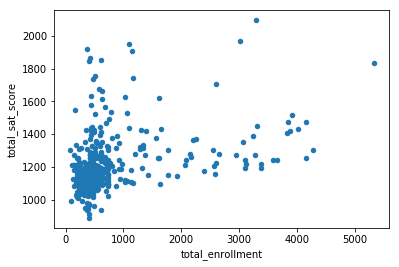

In [59]:
import matplotlib.pyplot as plt

combined.plot.scatter(x='total_enrollment', y='total_sat_score')
plt.show()

In [60]:
combined[(combined['total_enrollment'] < 1000) & (combined['total_sat_score'] < 1000)]["School Name"]


109      INTERNATIONAL COMMUNITY HIGH SCHOOL
148                                      NaN
149          BRONX INTERNATIONAL HIGH SCHOOL
163    KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
165    INTERNATIONAL SCHOOL FOR LIBERAL ARTS
208                                      NaN
211            HIGH SCHOOL OF WORLD CULTURES
222       BROOKLYN INTERNATIONAL HIGH SCHOOL
253                      PACIFIC HIGH SCHOOL
264    INTERNATIONAL HIGH SCHOOL AT PROSPECT
279               IT TAKES A VILLAGE ACADEMY
298                MULTICULTURAL HIGH SCHOOL
329     ASPIRATIONS DIPLOMA PLUS HIGH SCHOOL
335    PAN AMERICAN INTERNATIONAL HIGH SCHOO
Name: School Name, dtype: object

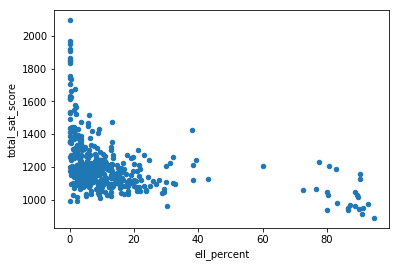

In [61]:
combined.plot.scatter(x='ell_percent', y='total_sat_score')
plt.show()

In [62]:
show_district_map("ell_percent")

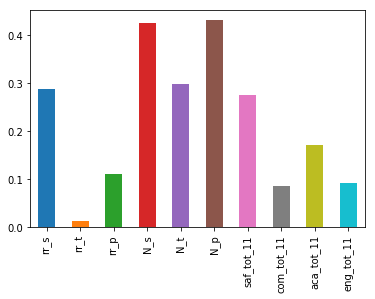

In [64]:
combined.corr()["total_sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()


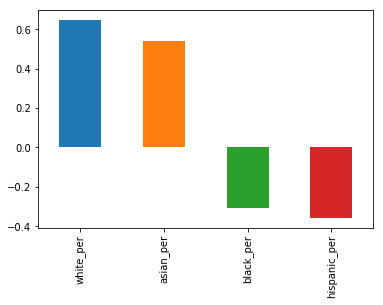

In [65]:
combined.corr()["total_sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()


In [66]:
show_district_map("hispanic_per")


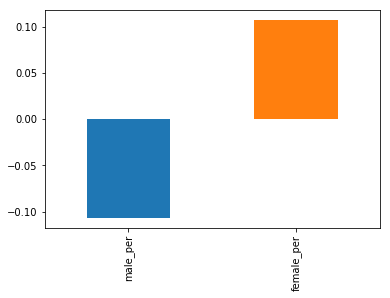

In [67]:
combined.corr()["total_sat_score"][["male_per", "female_per"]].plot.bar()


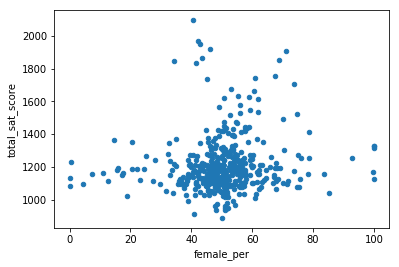

In [69]:
combined.plot.scatter(x='female_per', y='total_sat_score')

In [70]:
combined[(combined['female_per'] > 65) & (combined['total_sat_score'] > 1400)]['School Name']

8                    BARD HIGH SCHOOL EARLY COLLEGE
25            PROFESSIONAL PERFORMING ARTS HIGH SCH
30                    ELEANOR ROOSEVELT HIGH SCHOOL
44                     TALENT UNLIMITED HIGH SCHOOL
74             FIORELLO H. LAGUARDIA HIGH SCHOOL OF
352                     TOWNSEND HARRIS HIGH SCHOOL
395    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
Name: School Name, dtype: object

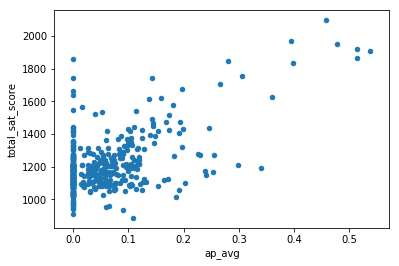

In [71]:
combined["ap_avg"] = combined["AP Test Takers "] / combined["total_enrollment"]
combined.plot.scatter(x='ap_avg', y='total_sat_score')

In [72]:
combined[(combined['ap_avg'] > 0.3) & (combined['total_sat_score'] > 1700)]['School Name']

30             ELEANOR ROOSEVELT HIGH SCHOOL
41                    STUYVESANT HIGH SCHOOL
176             BRONX HIGH SCHOOL OF SCIENCE
183    HIGH SCHOOL OF AMERICAN STUDIES AT LE
221           BROOKLYN TECHNICAL HIGH SCHOOL
352              TOWNSEND HARRIS HIGH SCHOOL
380    QUEENS HIGH SCHOOL FOR THE SCIENCES A
410      STATEN ISLAND TECHNICAL HIGH SCHOOL
Name: School Name, dtype: object